In [1]:
# import important libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
bias_correction = pd.read_csv('Bias_correction.csv',parse_dates=["Date"])
bias_correction.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [5]:
bias_correction.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaT,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [6]:
bias_correction.shape

(7752, 25)

In [7]:
bias_correction.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [8]:
bias_correction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

# Cleansing of Data

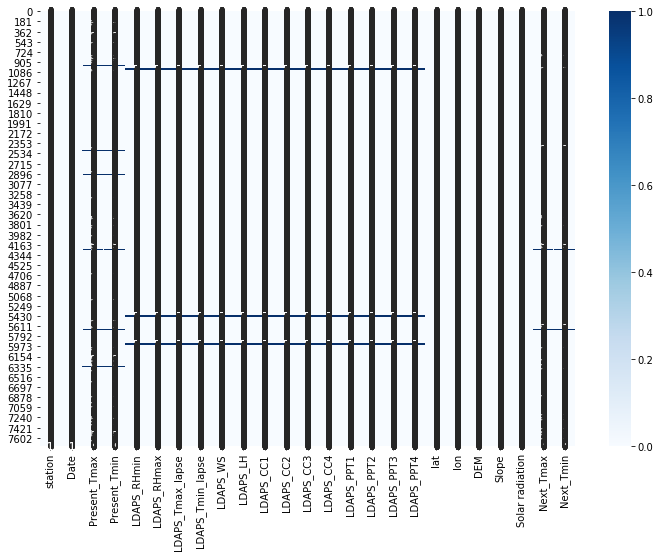

In [9]:
# checking if there are any null value present in the dataset using heatmap
plt.figure(figsize=(12,8))
sns.heatmap(bias_correction.isnull(),cmap="Blues",annot=True)
plt.show()

In [10]:
# checking the null value without using visualization
bias_correction.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [11]:
# finding idea about the null data
print("Station_Uniqueness: ", bias_correction.station.unique(), sep = '\n')
print("-"*60)
print(" Station_Count: ", bias_correction.station.value_counts(dropna=False),sep = '\n' )
print("*"*50)

Station_Uniqueness: 
[ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 23. 24. 25. nan]
------------------------------------------------------------
 Station_Count: 
25.0    310
23.0    310
2.0     310
3.0     310
4.0     310
5.0     310
6.0     310
7.0     310
8.0     310
9.0     310
10.0    310
11.0    310
12.0    310
13.0    310
14.0    310
15.0    310
16.0    310
18.0    310
20.0    310
22.0    310
24.0    310
17.0    310
19.0    310
21.0    310
1.0     310
NaN       2
Name: station, dtype: int64
**************************************************


In [12]:
# finding idea about the null data
print(" Date_Count: ", bias_correction.Date.value_counts(dropna=False),sep = '\n' )
print("*"*50)

 Date_Count: 
2017-08-21    25
2013-08-27    25
2015-08-21    25
2013-08-05    25
2014-07-09    25
              ..
2017-08-16    25
2013-07-20    25
2015-08-14    25
2016-07-17    25
NaT            2
Name: Date, Length: 311, dtype: int64
**************************************************


In [13]:
# finding NaN rows for for station and date columns
is_NaN = bias_correction.isnull()
rows_has_NaN = is_NaN.any(axis=1)
rows_with_NaN = bias_correction[rows_has_NaN]
print(rows_with_NaN)

      station       Date  Present_Tmax  Present_Tmin  LDAPS_RHmin  \
225       1.0 2013-07-09           NaN           NaN    70.051193   
271      22.0 2013-07-10           NaN           NaN    72.196007   
300       1.0 2013-07-12           NaN           NaN    95.027298   
450       1.0 2013-07-18           NaN           NaN    60.891193   
464      15.0 2013-07-18           NaN           NaN    52.795406   
...       ...        ...           ...           ...          ...   
7629      5.0 2017-08-26           NaN           NaN    43.755058   
7682      8.0 2017-08-28          26.3          18.1    29.959215   
7707      8.0 2017-08-29           NaN           NaN    44.392651   
7750      NaN        NaT          20.0          11.3    19.794666   
7751      NaN        NaT          37.6          29.9    98.524734   

      LDAPS_RHmax  LDAPS_Tmax_lapse  LDAPS_Tmin_lapse   LDAPS_WS    LDAPS_LH  \
225     99.668961         27.872808         22.907420  11.017837   44.002020   
271     95.

In [14]:
bias_correction.shape

(7752, 25)

In [15]:
# its shows that both the columns has NaN value in the same row, hence we'll drop the rows

# Making a copy of database
bias_data=bias_correction.copy()

bias_data.drop([7750, 7751], inplace = True)

In [16]:
bias_data.shape

(7750, 25)

In [17]:
bias_data.Present_Tmax.unique()

array([28.7, 31.9, 31.6, 32. , 31.4, 32.1, 31.7, 31.3, 32.5, 30.7, 32.8,
       30.9, 32.2, 32.7, 31.5, 28.3, 30.5, 30.3, 31. , 30.8, 30. , 30.6,
       30.1, 29.9, 31.8, 24.4, 27. , 28. , 27.7, 27.8, 28.8, 27.6, 26.9,
       27.5, 28.6, 26.2, 28.4, 26.7, 29. , 26.6, 27.1, 28.1, 27.9, 28.5,
       30.4, 29.1, 28.9, 29.4, 31.1, 29.5, 29.6, 24.9, 28.2, 26.1, 27.2,
       26.5, 27.4, 30.2, 32.4, 29.3, 29.8, 33.5, 29.2, 29.7, 25.9, 23.1,
       24.8, 26.3, 26.8, 25.8, 25.3, 25.1, 24.5, 25.4, 26. , 25.6, 26.4,
        nan, 27.3, 25.2, 23.3, 25.7, 25. , 25.5, 22.4, 24.6, 24.2, 24.7,
       24.3, 23.6, 24.1, 23. , 23.7, 23.8, 22.9, 24. , 22.7, 31.2, 32.6,
       32.9, 33.2, 33.6, 33.4, 33.9, 32.3, 33.1, 33. , 34. , 33.3, 34.7,
       34.3, 34.1, 33.8, 33.7, 35.2, 34.9, 34.2, 34.8, 35.5, 34.5, 34.4,
       35.1, 21.2, 23.4, 23.2, 23.9, 23.5, 35.7, 34.6, 22.5, 21.7, 22.8,
       35.9, 35.3, 20.6, 21.9, 22.2, 20.4, 22. , 35. , 36.5, 35.4, 35.6,
       21.4, 21.6, 22.1, 22.6, 37.5, 20.7, 21.5, 36

In [18]:
# usine linear interpolate with time method to impute null value
bias_data.set_index("Date", inplace=True)
bias = bias_data.interpolate(method="time")

In [19]:
bias.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [20]:
bias.shape

(7750, 24)

In [21]:
bias.reset_index(inplace=True)

In [22]:
bias.shape

(7750, 25)

In [23]:
bias.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7750 entries, 0 to 7749
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              7750 non-null   datetime64[ns]
 1   station           7750 non-null   float64       
 2   Present_Tmax      7750 non-null   float64       
 3   Present_Tmin      7750 non-null   float64       
 4   LDAPS_RHmin       7750 non-null   float64       
 5   LDAPS_RHmax       7750 non-null   float64       
 6   LDAPS_Tmax_lapse  7750 non-null   float64       
 7   LDAPS_Tmin_lapse  7750 non-null   float64       
 8   LDAPS_WS          7750 non-null   float64       
 9   LDAPS_LH          7750 non-null   float64       
 10  LDAPS_CC1         7750 non-null   float64       
 11  LDAPS_CC2         7750 non-null   float64       
 12  LDAPS_CC3         7750 non-null   float64       
 13  LDAPS_CC4         7750 non-null   float64       
 14  LDAPS_PPT1        7750 n

# Summary Statistics

In [24]:
# Making copy of Dataset
bias_df = bias.copy()

# From date of Date column extracting day,month and year respectively
bias_df['T_Day'] = pd.to_datetime(bias_df.Date, format='%d/%m/%Y').dt.day
bias_df['T_Month'] = pd.to_datetime(bias_df.Date, format='%d/%m/%Y').dt.month
bias_df['T_Year']= pd.to_datetime(bias_df.Date, format='%d/%m/%Y').dt.year

In [25]:
bias_df['Date'] = bias_df['Date'].astype(object)

In [26]:
bias_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7750 entries, 0 to 7749
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              7750 non-null   object 
 1   station           7750 non-null   float64
 2   Present_Tmax      7750 non-null   float64
 3   Present_Tmin      7750 non-null   float64
 4   LDAPS_RHmin       7750 non-null   float64
 5   LDAPS_RHmax       7750 non-null   float64
 6   LDAPS_Tmax_lapse  7750 non-null   float64
 7   LDAPS_Tmin_lapse  7750 non-null   float64
 8   LDAPS_WS          7750 non-null   float64
 9   LDAPS_LH          7750 non-null   float64
 10  LDAPS_CC1         7750 non-null   float64
 11  LDAPS_CC2         7750 non-null   float64
 12  LDAPS_CC3         7750 non-null   float64
 13  LDAPS_CC4         7750 non-null   float64
 14  LDAPS_PPT1        7750 non-null   float64
 15  LDAPS_PPT2        7750 non-null   float64
 16  LDAPS_PPT3        7750 non-null   float64


In [27]:
bias_df.describe()
# there ia a significanr difference between 75% and max

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,T_Day,T_Month,T_Year
count,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,...,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000,7750.000000
mean,13.000000,29.765819,23.226761,56.763807,88.380670,29.631790,23.535658,7.085766,62.699567,0.369839,...,37.544720,126.991400,61.854944,1.256692,5341.549330,30.272439,22.932555,15.983871,7.467742,2015.000000
std,7.211568,2.968389,2.407062,14.607609,7.161300,2.940018,2.342511,2.170080,33.742549,0.261849,...,0.050335,0.079406,54.256953,1.369833,428.996445,3.125367,2.482304,8.918647,0.530334,1.414305
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,37.456200,126.826000,12.370000,0.098500,4329.520508,17.400000,11.300000,1.000000,6.000000,2013.000000
25%,7.000000,27.800000,21.700000,46.048225,84.211046,27.693733,22.115268,5.675527,37.547426,0.148339,...,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000,8.000000,7.000000,2014.000000
50%,13.000000,29.900000,23.400000,54.983641,89.808819,29.711911,23.782403,6.542060,57.106744,0.317415,...,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,16.000000,7.000000,2015.000000
75%,19.000000,32.000000,24.900000,67.218334,93.703491,31.743110,25.185891,8.005363,84.318498,0.576634,...,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,24.000000,8.000000,2016.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,37.645000,127.135000,212.335000,5.178200,5992.895996,38.900000,29.800000,31.000000,8.000000,2017.000000


# Data Visualization

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001DB8ABAD408>,
      dtype=object)

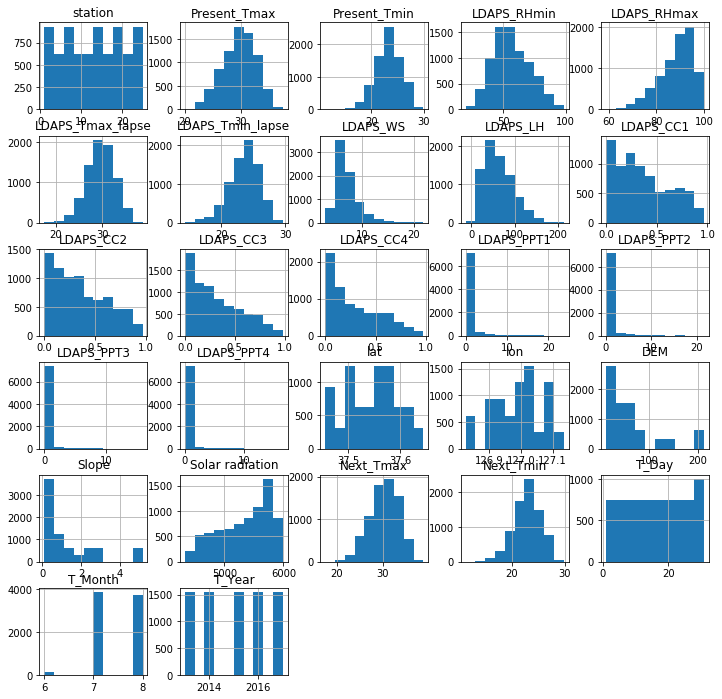

In [28]:
bias_df.hist(figsize=(12,12))

<Figure size 1728x1728 with 0 Axes>

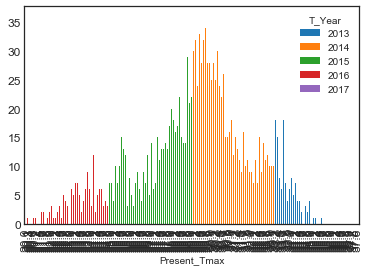

In [71]:
# relationship of Present_Tmax with year
plt.figure(figsize=(24,24))
bias_df.groupby(['Present_Tmax','T_Year']).size().unstack("T_Year").plot(kind="bar",fontsize=12)

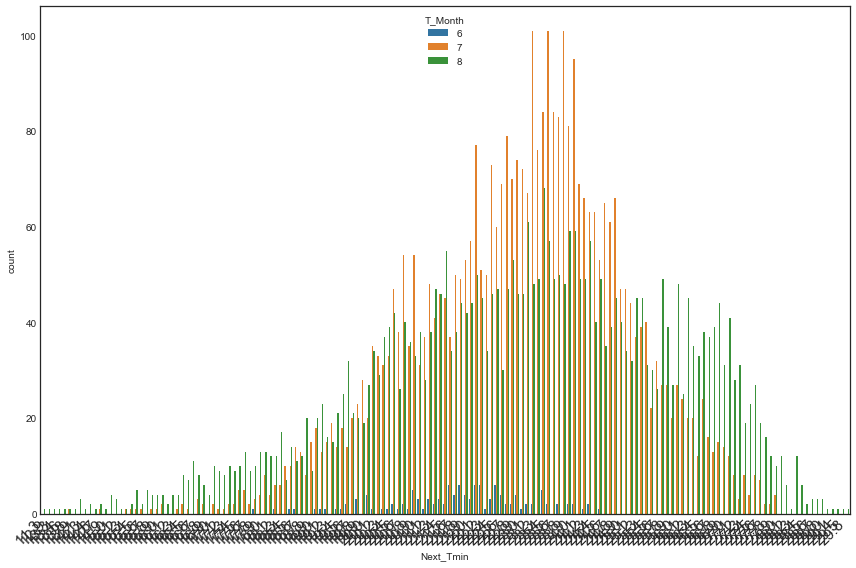

In [73]:
# Well try to find the relation between Next_Tmin and T_Month
plt.figure(figsize=(12,8))
chart = sns.countplot(bias_df['Next_Tmin'], hue=bias_df['T_Month'])
chart.set_xticklabels(chart.get_xticklabels(),rotation=45,fontsize=15, ha="right")
plt.tight_layout()

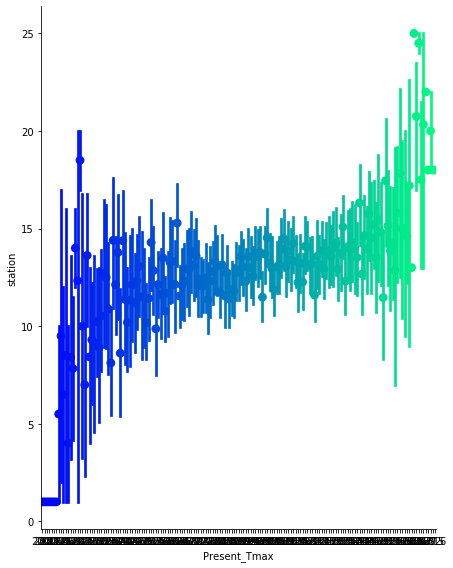

In [29]:
# Finding what is the Present_Tmax across Staion
sns.factorplot('Present_Tmax','station',data=bias_df,size=8,aspect=0.8,palette='winter',join=False)

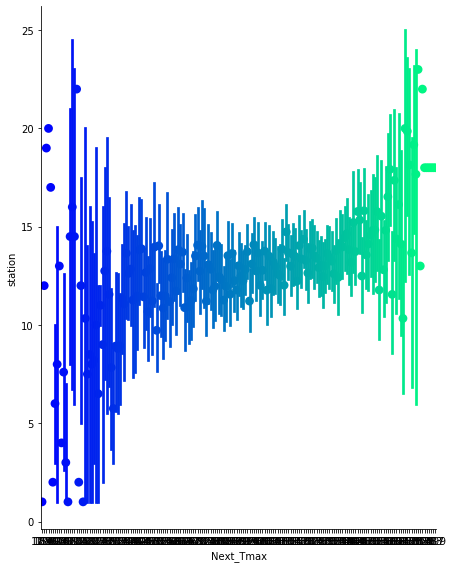

In [30]:
# Finding what is the Next_Tmax across Staion
sns.factorplot('Next_Tmax','station',data=bias_df,size=8,aspect=0.8,palette='winter',join=False)

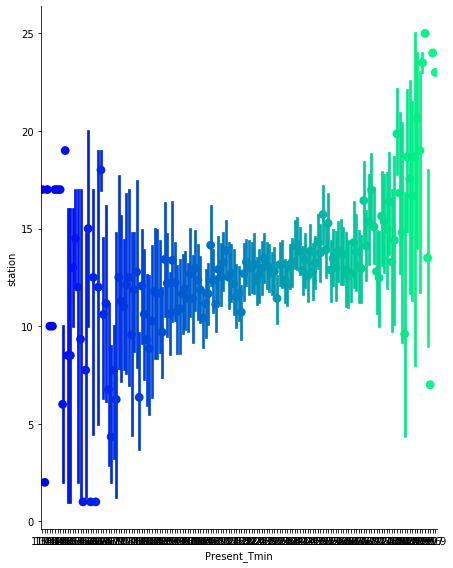

In [31]:
# Finding what is the Present_Tmin across Staion
sns.factorplot('Present_Tmin','station',data=bias_df,size=8,aspect=0.8,palette='winter',join=False)

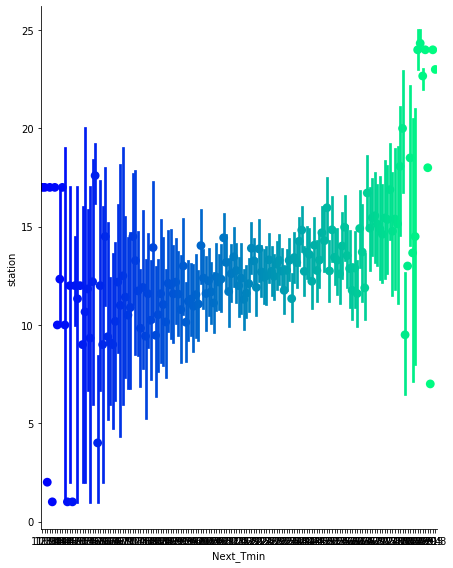

In [32]:
# Finding what is the Present_Tmin across Staion
sns.factorplot('Next_Tmin','station',data=bias_df,size=8,aspect=0.8,palette='winter',join=False)

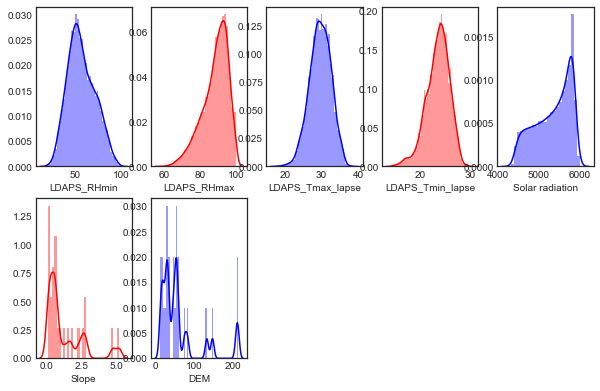

In [33]:
# visualization of features
plt.figure(figsize = (24,24))
plt.style.use('seaborn-white')

plt.subplot(351)
sns.distplot(bias_df['LDAPS_RHmin'],color='blue',)
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(352)
sns.distplot(bias_df['LDAPS_RHmax'],color='red')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(353)
sns.distplot(bias_df['LDAPS_Tmax_lapse'],color='blue',)
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(354)
sns.distplot(bias_df['LDAPS_Tmin_lapse'],color='red')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(355)
sns.distplot(bias_df['Solar radiation'],color='blue')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(356)
sns.distplot(bias_df['Slope'],color='red')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(357)
sns.distplot(bias_df['DEM'],color='blue')
fig = plt.gcf()
fig.set_size_inches(10,10)



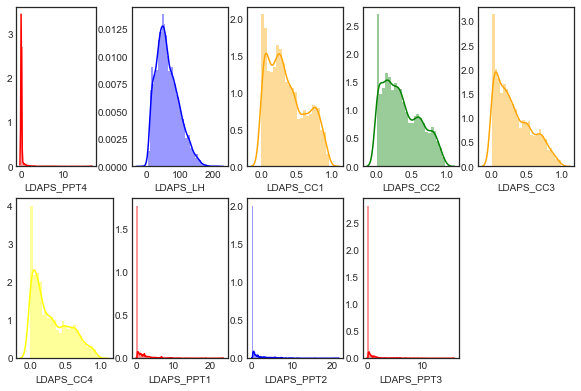

In [34]:
# visualization of features
plt.figure(figsize = (24,24))
plt.style.use('seaborn-white')


plt.subplot(351)
sns.distplot(bias_df['LDAPS_WS'],color='orange',)
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(352)
sns.distplot(bias_df['LDAPS_LH'],color='blue')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(353)
sns.distplot(bias_df['LDAPS_CC1'],color='orange',)
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(354)
sns.distplot(bias_df['LDAPS_CC2'],color='green')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(355)
sns.distplot(bias_df['LDAPS_CC3'],color='orange')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(356)
sns.distplot(bias_df['LDAPS_CC4'],color='yellow')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(357)
sns.distplot(bias_df['LDAPS_PPT1'],color='red')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(358)
sns.distplot(bias_df['LDAPS_PPT2'],color='blue')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(359)
sns.distplot(bias_df['LDAPS_PPT3'],color='red')
fig = plt.gcf()
fig.set_size_inches(10,10)

plt.subplot(361)
sns.distplot(bias_df['LDAPS_PPT4'],color='red',kde_kws={'bw':0.1})
fig = plt.gcf()
fig.set_size_inches(10,10)

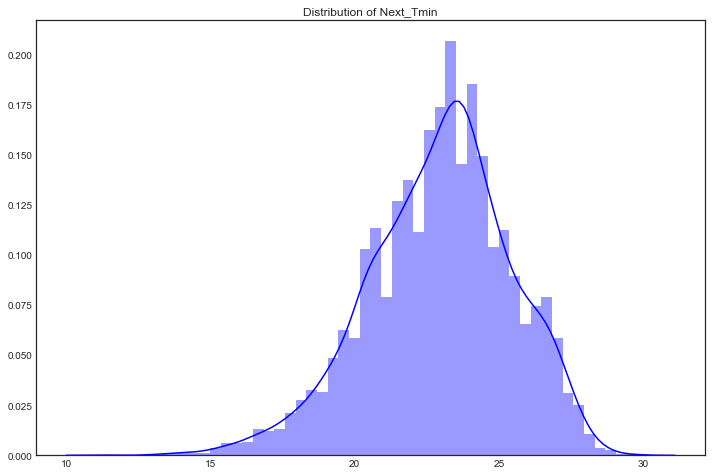

In [35]:
plt.figure(figsize=(12,8))
plt.title("Distribution of Next_Tmin")
price = bias_df['Next_Tmin'].values
sns.distplot(price, color = 'blue')

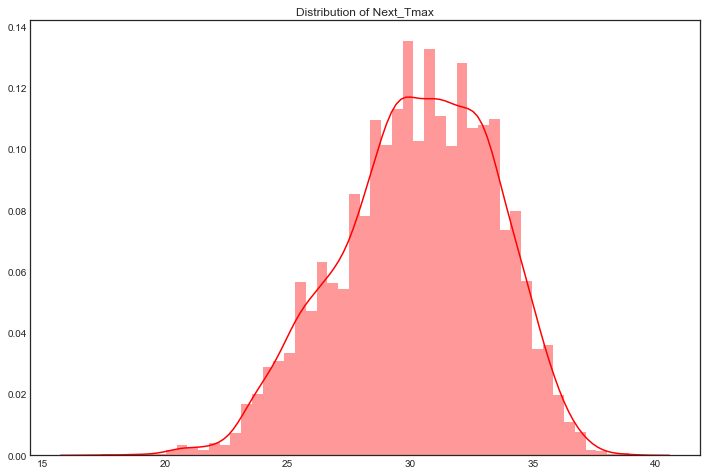

In [36]:
plt.figure(figsize=(12,8))
plt.title("Distribution of Next_Tmax")
price = bias_df['Next_Tmax'].values
sns.distplot(price, color = 'red')

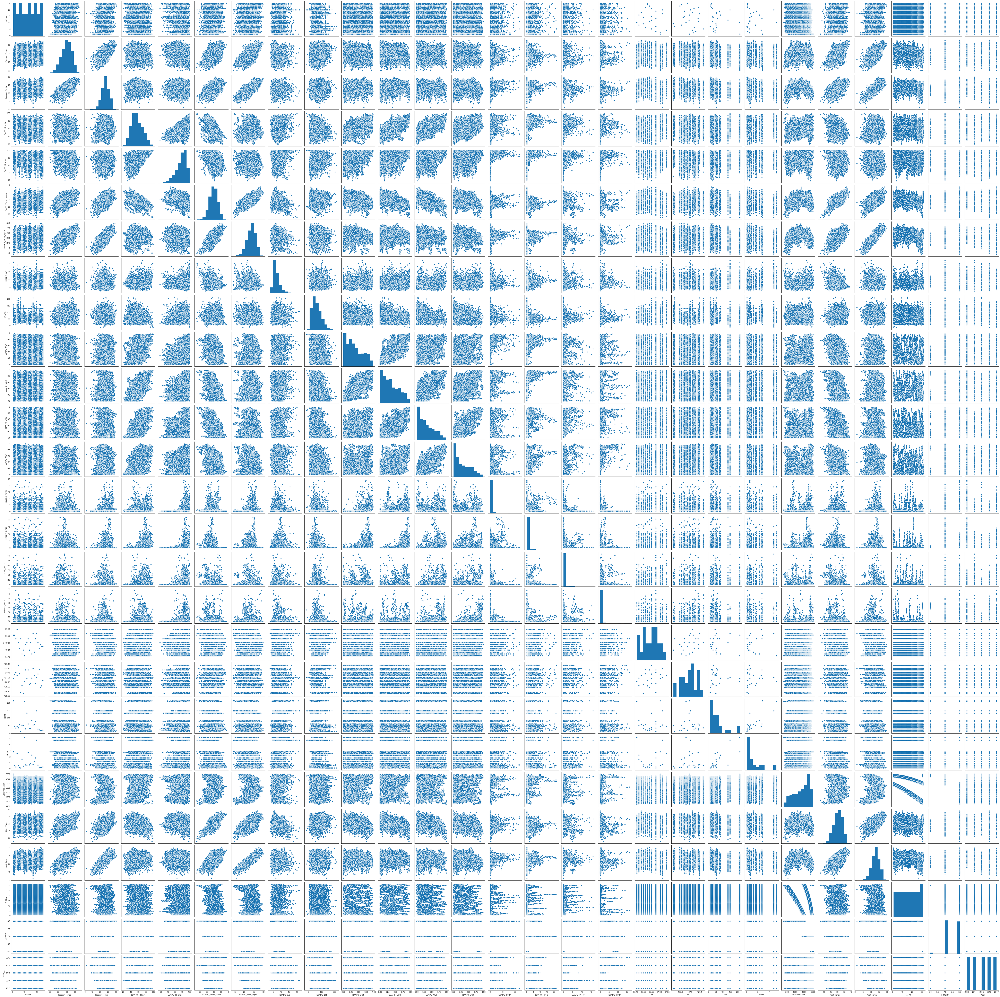

In [37]:
# Bivariate Analysis
sns.pairplot(bias_df)

# Checking Correlation

In [41]:
dfcor = bias.corr()
dfcor

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.111115,0.130543,-0.066693,-0.166909,0.068949,0.104390,0.005285,-0.132680,0.006902,...,-0.008321,-0.012607,-0.010526,-0.237610,-0.118763,-0.255970,-0.090113,-0.019011,0.107096,0.128341
Present_Tmax,0.111115,1.000000,0.618241,-0.205882,-0.307388,0.572081,0.628086,-0.130209,0.133745,-0.311454,...,-0.105003,-0.128664,-0.104939,-0.054603,0.004523,-0.188621,-0.108807,-0.027527,0.611295,0.623452
Present_Tmin,0.130543,0.618241,1.000000,0.122622,-0.018064,0.469405,0.773388,-0.043861,-0.003208,0.087530,...,0.064042,-0.054891,-0.070016,-0.080208,-0.048154,-0.251395,-0.148861,0.051543,0.470601,0.797676
LDAPS_RHmin,-0.066693,-0.205882,0.122622,1.000000,0.578261,-0.568729,0.086230,0.290207,-0.076137,0.614215,...,0.391792,0.238349,0.165268,0.085777,-0.077576,0.100789,0.122408,0.245383,-0.443726,0.092991
LDAPS_RHmax,-0.166909,-0.307388,-0.018064,0.578261,1.000000,-0.376657,-0.116142,0.133128,0.237291,0.436902,...,0.229081,0.133113,0.116089,0.194448,0.024184,0.176120,0.218577,0.150227,-0.288361,-0.076836
LDAPS_Tmax_lapse,0.068949,0.572081,0.469405,-0.568729,-0.376657,1.000000,0.654306,-0.317205,0.052739,-0.439296,...,-0.251064,-0.196881,-0.168720,-0.043722,0.088697,-0.180150,-0.163620,0.039734,0.834924,0.590129
LDAPS_Tmin_lapse,0.104390,0.628086,0.773388,0.086230,-0.116142,0.654306,1.000000,-0.137518,-0.128824,0.012477,...,-0.003912,-0.096110,-0.102376,-0.097527,-0.028289,-0.196272,-0.186695,0.152077,0.595793,0.885383
LDAPS_WS,0.005285,-0.130209,-0.043861,0.290207,0.133128,-0.317205,-0.137518,1.000000,0.001842,0.283741,...,0.182050,0.152766,0.134967,0.034542,-0.061699,0.188799,0.169275,0.122045,-0.355034,-0.107081
LDAPS_LH,-0.132680,0.133745,-0.003208,-0.076137,0.237291,0.052739,-0.128824,0.001842,1.000000,-0.148202,...,-0.087927,0.006697,0.010726,0.130943,0.024054,0.053018,0.084492,-0.053176,0.164375,-0.054354
LDAPS_CC1,0.006902,-0.311454,0.087530,0.614215,0.436902,-0.439296,0.012477,0.283741,-0.148202,1.000000,...,0.390711,0.165591,0.087550,-0.009022,-0.007742,-0.015048,-0.021712,0.218367,-0.452784,-0.010466


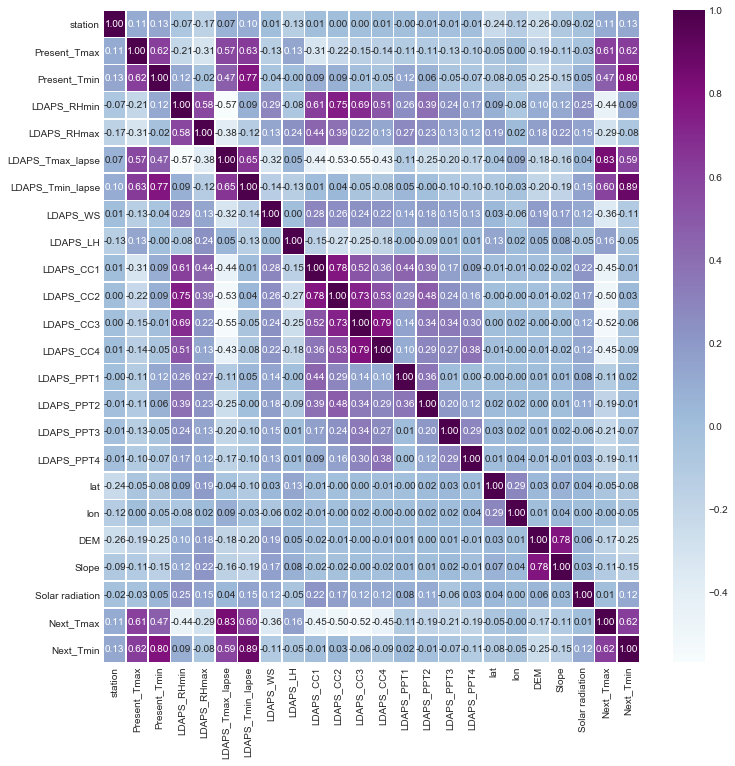

In [42]:
# visual representation of correlation using heatmap
plt.figure(figsize=(12,12))
sns.heatmap(dfcor,cmap='BuPu', annot=True,fmt='0.2f', linewidths=0.5)
# darker shade are positive correlation and lighter shade are negative correlation

# Plotting Outliers

In [51]:
biasdata = bias_df.copy()
biasdata.shape

(7750, 28)

In [52]:
# Dropping Date column as we do not require it now
biasdata.drop(['Date'],inplace=True,axis=1)
biasdata.shape

(7750, 27)

In [53]:
collist = biasdata.columns.values
ncol = 27
nrows = 10

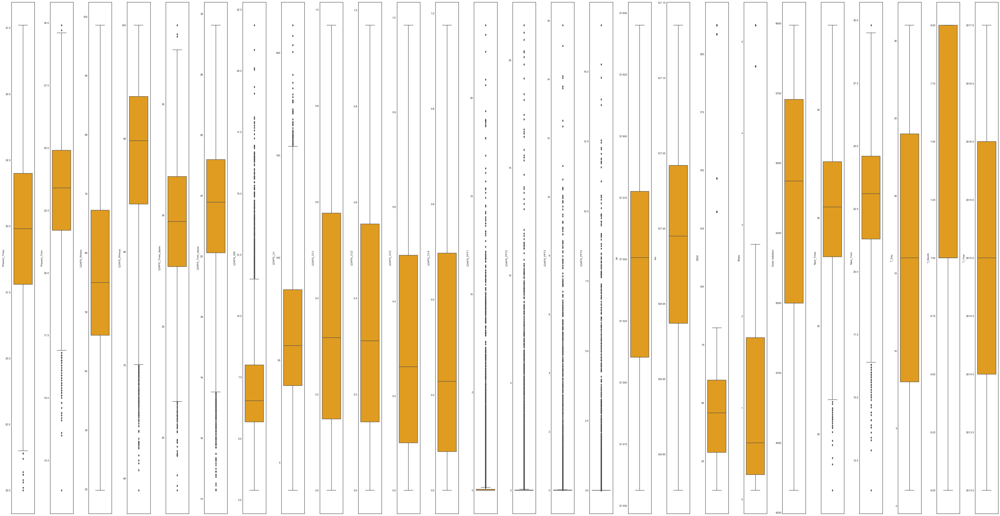

In [54]:
plt.figure(figsize=(2*ncol,10*ncol))
for i in range(1, len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(biasdata[collist[i]],orient='v',color='orange')
    plt.tight_layout()

In [55]:
# finding outliers if there are any in the dataset

from scipy.stats import zscore
z_score=abs(zscore(biasdata))
print(biasdata.shape)
df_bias=biasdata.loc[(z_score<3).all(axis=1)]
print(df_bias.shape)
# outliners have been removed and the new shape of the dataset is reflection below

(7750, 27)
(6868, 27)


# Checking for Skewness

In [56]:
df_bias.skew()
# data got positive skewness

station             0.002845
Present_Tmax       -0.275346
Present_Tmin       -0.218498
LDAPS_RHmin         0.303377
LDAPS_RHmax        -0.680317
LDAPS_Tmax_lapse   -0.113230
LDAPS_Tmin_lapse   -0.394279
LDAPS_WS            1.096575
LDAPS_LH            0.568905
LDAPS_CC1           0.587518
LDAPS_CC2           0.499392
LDAPS_CC3           0.695120
LDAPS_CC4           0.701835
LDAPS_PPT1          3.677487
LDAPS_PPT2          4.779610
LDAPS_PPT3          5.503598
LDAPS_PPT4          5.959453
lat                 0.107962
lon                -0.274988
DEM                 1.765075
Slope               1.594973
Solar radiation    -0.509983
Next_Tmax          -0.265150
Next_Tmin          -0.234679
T_Day              -0.005523
T_Month            -0.185491
T_Year              0.006539
dtype: float64

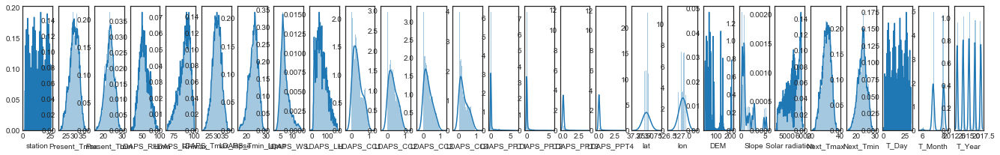

In [57]:
plt.figure(figsize=(23,36))
for i in range (0,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.distplot(df_bias[collist[i]],kde_kws={'bw':0.1})

In [58]:
# treating skewness with log
import numpy as np
for col in df_bias.columns:
    if df_bias.skew().loc[col]>0.55:
        df_bias[col] = np.log1p(df_bias[col])

df_bias.skew()
# positive skewness still reflecting

station             0.002845
Present_Tmax       -0.275346
Present_Tmin       -0.218498
LDAPS_RHmin         0.303377
LDAPS_RHmax        -0.680317
LDAPS_Tmax_lapse   -0.113230
LDAPS_Tmin_lapse   -0.394279
LDAPS_WS            0.486883
LDAPS_LH           -0.622038
LDAPS_CC1           0.323618
LDAPS_CC2           0.499392
LDAPS_CC3           0.434505
LDAPS_CC4           0.486411
LDAPS_PPT1          2.692028
LDAPS_PPT2          3.548719
LDAPS_PPT3          4.228941
LDAPS_PPT4          4.636374
lat                 0.107962
lon                -0.274988
DEM                 0.450832
Slope               0.848875
Solar radiation    -0.509983
Next_Tmax          -0.265150
Next_Tmin          -0.234679
T_Day              -0.005523
T_Month            -0.185491
T_Year              0.006539
dtype: float64

In [59]:
# treating with square root
list = ['LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4']
for i in list:
    df_bias[i]=np.sqrt(df_bias[i])

df_bias.skew()
# skewness still reflecting

station             0.002845
Present_Tmax       -0.275346
Present_Tmin       -0.218498
LDAPS_RHmin         0.303377
LDAPS_RHmax        -0.680317
LDAPS_Tmax_lapse   -0.113230
LDAPS_Tmin_lapse   -0.394279
LDAPS_WS            0.486883
LDAPS_LH           -0.622038
LDAPS_CC1           0.323618
LDAPS_CC2           0.499392
LDAPS_CC3           0.434505
LDAPS_CC4           0.486411
LDAPS_PPT1          1.965663
LDAPS_PPT2          2.417111
LDAPS_PPT3          2.803852
LDAPS_PPT4          3.180478
lat                 0.107962
lon                -0.274988
DEM                 0.450832
Slope               0.848875
Solar radiation    -0.509983
Next_Tmax          -0.265150
Next_Tmin          -0.234679
T_Day              -0.005523
T_Month            -0.185491
T_Year              0.006539
dtype: float64

In [60]:
# treating with cube root
list = ['LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4']
for i in list:
    df_bias[i]=np.cbrt(df_bias[i])

df_bias.skew()
# skewness still reflecting

station             0.002845
Present_Tmax       -0.275346
Present_Tmin       -0.218498
LDAPS_RHmin         0.303377
LDAPS_RHmax        -0.680317
LDAPS_Tmax_lapse   -0.113230
LDAPS_Tmin_lapse   -0.394279
LDAPS_WS            0.486883
LDAPS_LH           -0.622038
LDAPS_CC1           0.323618
LDAPS_CC2           0.499392
LDAPS_CC3           0.434505
LDAPS_CC4           0.486411
LDAPS_PPT1          1.088128
LDAPS_PPT2          1.332871
LDAPS_PPT3          1.465415
LDAPS_PPT4          1.857667
lat                 0.107962
lon                -0.274988
DEM                 0.450832
Slope               0.848875
Solar radiation    -0.509983
Next_Tmax          -0.265150
Next_Tmin          -0.234679
T_Day              -0.005523
T_Month            -0.185491
T_Year              0.006539
dtype: float64

# Seperating input and outpur, here we have two output

In [ ]:
# defining x and y 
x = df_bias.drop(),axis=1
y = df_bias[].copy()